## Importations

In [32]:
%reload_ext autoreload
%autoreload 2

import sys
from pathlib import Path
sys.path.append(str(Path.cwd().parent))
from src.make_dataset import load_data
from settings.params import MODEL_PARAMS, SEED

import pandas as pd
import missingno as msno
import numpy as np
import plotly.express as px
import seaborn as sns
from loguru import logger
import ppscore as pps

## Settings

In [33]:
# target name definition
TARGET_NAME = MODEL_PARAMS["TARGET_NAME"]

In [34]:
MODEL_PARAMS

{'TRAIN_PATH': '../data/train.csv',
 'DATA_PATH': '../data/restaurant_data.csv',
 'DATA_PREPROCESSED_PATH': '../data/preprocessed.csv',
 'TEST_PATH': '../data/test.csv',
 'TARGET_NAME': 'revenue',
 'MIN_COMPLETION_RATE': 0.8,
 'MIN_PPS': 0.01,
 'TEST_SIZE': 0.2,
 'DEFAULT_FEATURE_NAMES': ['city',
  'city group',
  'type',
  'p1',
  'p2',
  'p3',
  'p4',
  'p5',
  'p6',
  'p7',
  'p8',
  'p9',
  'p10',
  'p11',
  'p12',
  'p13',
  'p14',
  'p15',
  'p16',
  'p17',
  'p18',
  'p19',
  'p20',
  'p21',
  'p22',
  'p23',
  'p24',
  'p25',
  'p26',
  'p27',
  'p28',
  'p29',
  'p30',
  'p31',
  'p32',
  'p33',
  'p34',
  'p35',
  'p36',
  'p37',
  'day',
  'day_name',
  'month',
  'years']}

## Data collection

In [4]:
data = load_data(MODEL_PARAMS["TRAIN_PATH"],columns_to_lower=True)

2024-08-07 13:49:39.990 | INFO     | src.make_dataset:load_data:17 - Dataset lo load from : ../data/train.csv
2024-08-07 13:49:40.001 | INFO     | src.make_dataset:load_data:23 - Data shape: (137, 43)
2024-08-07 13:49:40.059 | INFO     | src.make_dataset:load_data:24 - Data description:                Id          P1          P2          P3          P4          P5  \
count  137.000000  137.000000  137.000000  137.000000  137.000000  137.000000   
mean    68.000000    4.014599    4.408759    4.317518    4.372263    2.007299   
std     39.692569    2.910391    1.514900    1.032337    1.016462    1.209620   
min      0.000000    1.000000    1.000000    0.000000    3.000000    1.000000   
25%     34.000000    2.000000    4.000000    4.000000    4.000000    1.000000   
50%     68.000000    3.000000    5.000000    4.000000    4.000000    2.000000   
75%    102.000000    4.000000    5.000000    5.000000    5.000000    2.000000   
max    136.000000   12.000000    7.500000    7.500000    7.50000

In [5]:
data.head()

,id,open date,city,city group,type,p1,p2,p3,p4,p5,...,p29,p30,p31,p32,p33,p34,p35,p36,p37,revenue
0,0,07/17/1999,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,...,3.0,5,3,4,5,5,4,3,4,5653753.0
1,1,02/14/2008,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,...,3.0,0,0,0,0,0,0,0,0,6923131.0
2,2,03/09/2013,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,...,3.0,0,0,0,0,0,0,0,0,2055379.0
3,3,02/02/2012,Tokat,Other,IL,6,4.5,6.0,6.0,4,...,7.5,25,12,10,6,18,12,12,6,2675511.0
4,4,05/09/2009,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,...,3.0,5,1,3,2,3,4,3,3,4316715.0


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137 entries, 0 to 136
Data columns (total 43 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          137 non-null    int64  
 1   open date   137 non-null    object 
 2   city        137 non-null    object 
 3   city group  137 non-null    object 
 4   type        137 non-null    object 
 5   p1          137 non-null    int64  
 6   p2          137 non-null    float64
 7   p3          137 non-null    float64
 8   p4          137 non-null    float64
 9   p5          137 non-null    int64  
 10  p6          137 non-null    int64  
 11  p7          137 non-null    int64  
 12  p8          137 non-null    int64  
 13  p9          137 non-null    int64  
 14  p10         137 non-null    int64  
 15  p11         137 non-null    int64  
 16  p12         137 non-null    int64  
 17  p13         137 non-null    float64
 18  p14         137 non-null    int64  
 19  p15         137 non-null    i

In [7]:
data.shape

(137, 43)

In [8]:
data.describe(include="all")

,id,open date,city,city group,type,p1,p2,p3,p4,p5,...,p29,p30,p31,p32,p33,p34,p35,p36,p37,revenue
count,137.000000,137,137,137,137,137.000000,137.000000,137.000000,137.000000,137.000000,...,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,1.370000e+02
unique,NaN,134,34,2,3,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,02/23/2010,İstanbul,Big Cities,FC,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,2,50,78,76,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,68.000000,NaN,NaN,NaN,NaN,4.014599,4.408759,4.317518,4.372263,2.007299,...,3.135036,2.729927,1.941606,2.525547,1.138686,2.489051,2.029197,2.211679,1.116788,4.453533e+06
std,39.692569,NaN,NaN,NaN,NaN,2.910391,1.514900,1.032337,1.016462,1.209620,...,1.680887,5.536647,3.512093,5.230117,1.698540,5.165093,3.436272,4.168211,1.790768,2.576072e+06
min,0.000000,NaN,NaN,NaN,NaN,1.000000,1.000000,0.000000,3.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.149870e+06
25%,34.000000,NaN,NaN,NaN,NaN,2.000000,4.000000,4.000000,4.000000,1.000000,...,2.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.999068e+06
50%,68.000000,NaN,NaN,NaN,NaN,3.000000,5.000000,4.000000,4.000000,2.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.939804e+06
75%,102.000000,NaN,NaN,NaN,NaN,4.000000,5.000000,5.000000,5.000000,2.000000,...,3.000000,4.000000,3.000000,3.000000,2.000000,3.000000,4.000000,3.000000,2.000000,5.166635e+06


## EDA: Exploratory Data Analysis

In [9]:
data.isna().sum()

id            0
open date     0
city          0
city group    0
type          0
p1            0
p2            0
p3            0
p4            0
p5            0
p6            0
p7            0
p8            0
p9            0
p10           0
p11           0
p12           0
p13           0
p14           0
p15           0
p16           0
p17           0
p18           0
p19           0
p20           0
p21           0
p22           0
p23           0
p24           0
p25           0
p26           0
p27           0
p28           0
p29           0
p30           0
p31           0
p32           0
p33           0
p34           0
p35           0
p36           0
p37           0
revenue       0
dtype: int64

In [10]:
data.columns

Index(['id', 'open date', 'city', 'city group', 'type', 'p1', 'p2', 'p3', 'p4',
       'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15',
       'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25',
       'p26', 'p27', 'p28', 'p29', 'p30', 'p31', 'p32', 'p33', 'p34', 'p35',
       'p36', 'p37', 'revenue'],
      dtype='object')

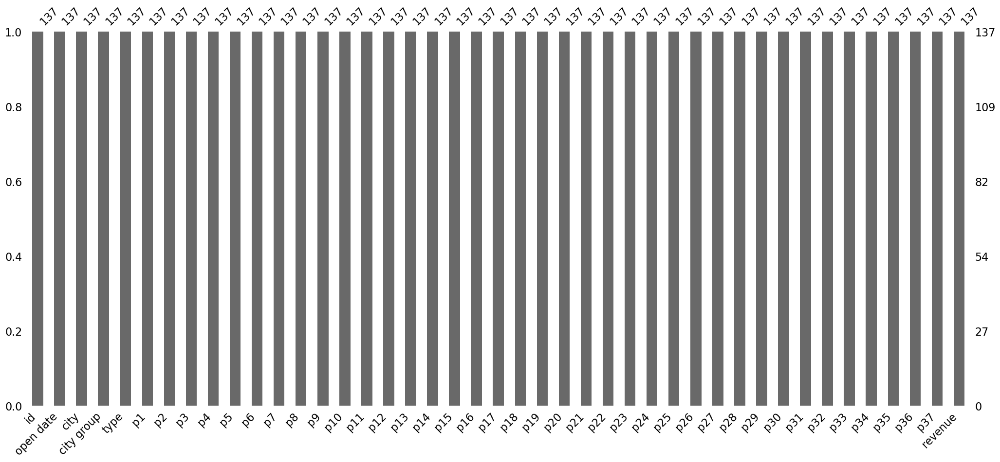

In [11]:
# barplot for missing value rate
msno.bar(data,
         filter="top",
         p=MODEL_PARAMS["MIN_COMPLETION_RATE"],
        );

In [25]:
data["open date"] = pd.to_datetime(data["open date"])
data["day"] = data["open date"].dt.day
data["day_name"] = data["open date"].dt.day_name()
data["month"] = data["open date"].dt.month
data["years"] = data["open date"].dt.year
data.drop("open date",axis=1,inplace=True)

In [31]:
data.columns

Index(['id', 'city', 'city group', 'type', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6',
       'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16',
       'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26',
       'p27', 'p28', 'p29', 'p30', 'p31', 'p32', 'p33', 'p34', 'p35', 'p36',
       'p37', 'revenue', 'day', 'day_name', 'month', 'years'],
      dtype='object')

In [26]:
data["city"].unique()

array(['İstanbul', 'Ankara', 'Diyarbakır', 'Tokat', 'Gaziantep',
       'Afyonkarahisar', 'Edirne', 'Kocaeli', 'Bursa', 'İzmir', 'Sakarya',
       'Elazığ', 'Kayseri', 'Eskişehir', 'Şanlıurfa', 'Samsun', 'Adana',
       'Antalya', 'Kastamonu', 'Uşak', 'Muğla', 'Kırklareli', 'Konya',
       'Karabük', 'Tekirdağ', 'Denizli', 'Balıkesir', 'Aydın', 'Amasya',
       'Kütahya', 'Bolu', 'Trabzon', 'Isparta', 'Osmaniye'], dtype=object)

In [27]:
data["type"].unique()

array(['IL', 'FC', 'DT'], dtype=object)

In [28]:
data["city group"].unique()

array(['Big Cities', 'Other'], dtype=object)

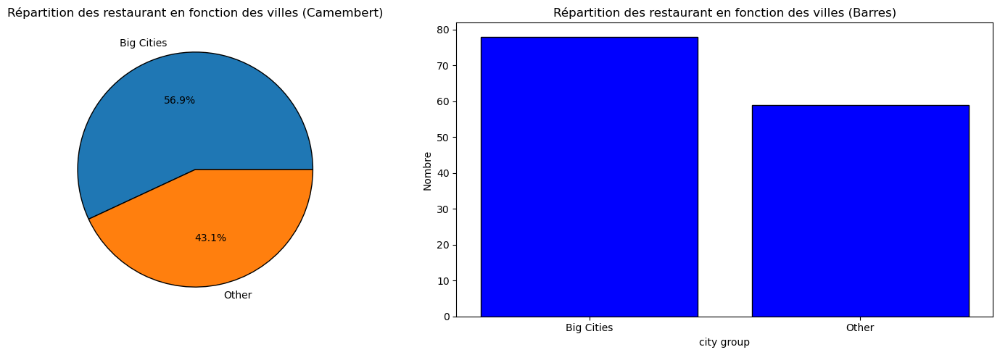

In [29]:
import matplotlib.pyplot as plt

# Création de la figure avec deux sous-graphiques
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Données
group_dict = dict(data["city group"].value_counts())

# Diagramme en camembert
axs[0].pie(group_dict.values(), labels=group_dict.keys(), wedgeprops={"edgecolor": "black"}, autopct="%1.1f%%")
axs[0].set_title('Répartition des restaurant en fonction des villes (Camembert)')

# Diagramme en barres
axs[1].bar(group_dict.keys(), group_dict.values(), color='blue', edgecolor='black')
axs[1].set_title('Répartition des restaurant en fonction des villes (Barres)')
axs[1].set_xlabel('city group')
axs[1].set_ylabel('Nombre')

# Ajustement de la mise en page
plt.tight_layout()

# Affichage de la figure
plt.show()


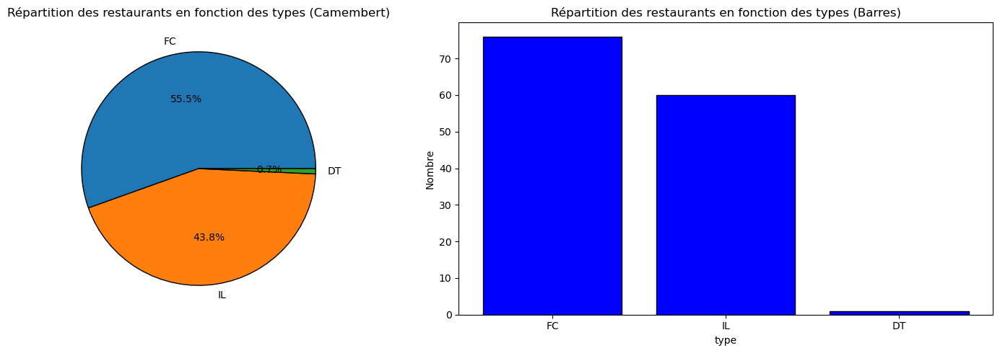

In [30]:
# Création de la figure avec deux sous-graphiques
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Données
group_dict = dict(data["type"].value_counts())

# Diagramme en camembert
axs[0].pie(group_dict.values(), labels=group_dict.keys(), wedgeprops={"edgecolor": "black"}, autopct="%1.1f%%")
axs[0].set_title('Répartition des restaurants en fonction des types (Camembert)')

# Diagramme en barres
axs[1].bar(group_dict.keys(), group_dict.values(), color='blue', edgecolor='black')
axs[1].set_title('Répartition des restaurants en fonction des types (Barres)')
axs[1].set_xlabel('type')
axs[1].set_ylabel('Nombre')

# Ajustement de la mise en page
plt.tight_layout()

# Affichage de la figure
plt.show()

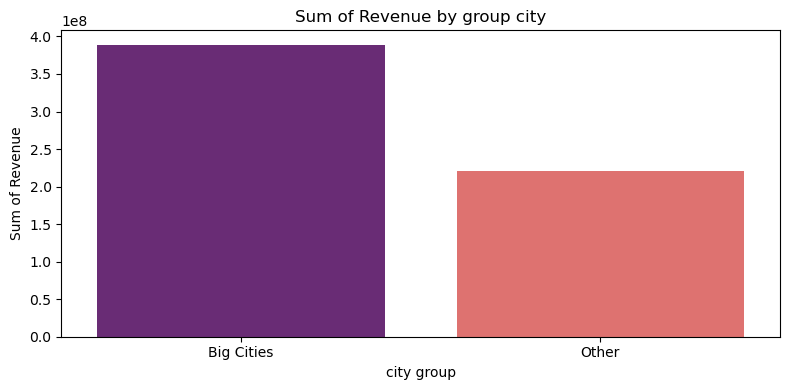

In [23]:
# Regrouper les données par Location et calculer la somme des revenus
loc_df = data.groupby("city group")["revenue"].agg("sum").reset_index()

# Définir la taille de la figure
plt.figure(figsize=(8, 4))

# Créer un graphique en barres
sns.barplot(x=loc_df["city group"], y=loc_df["revenue"], palette="magma")

# Ajouter un titre et une étiquette pour l'axe des y
plt.ylabel("Sum of Revenue")
plt.title("Sum of Revenue by group city")

# Ajuster la mise en page
plt.tight_layout()

# Afficher le graphique
plt.show()


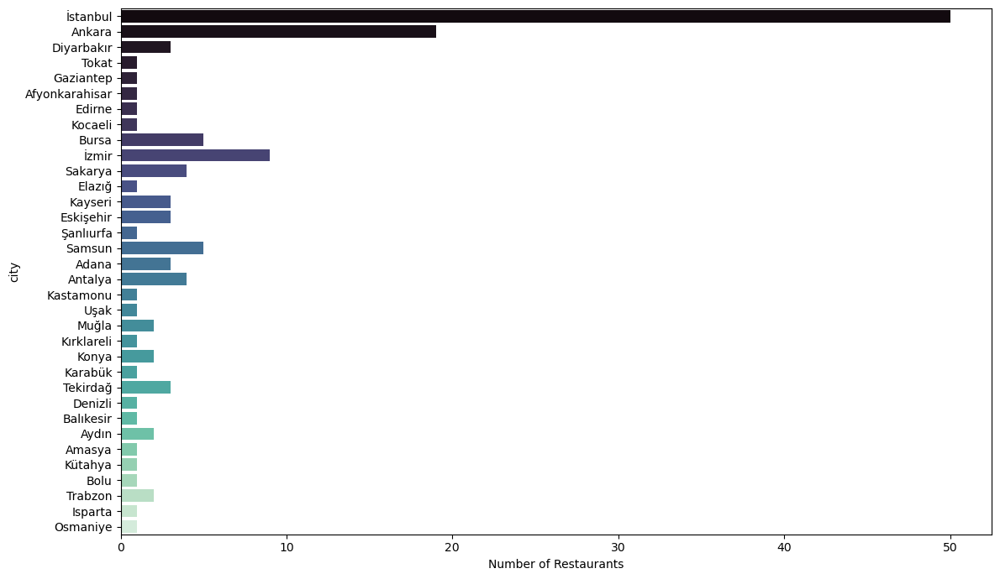

In [37]:
plt.figure(figsize=(12,7))
sns.countplot(y= data["city"],palette="mako")
plt.xlabel("Number of Restaurants")
plt.tight_layout()

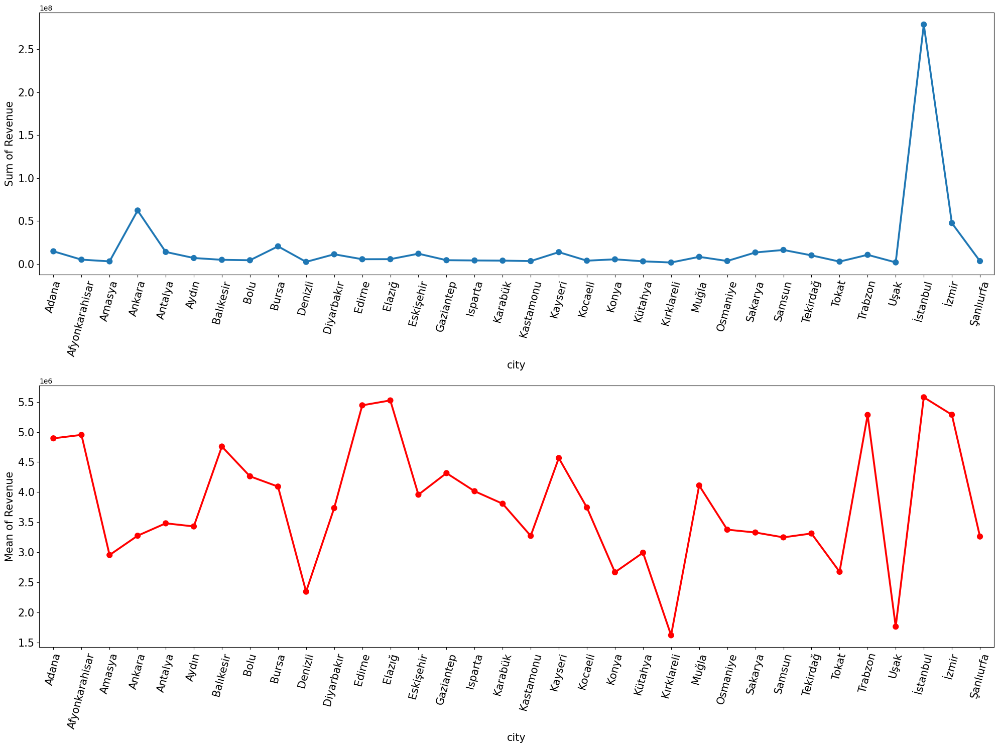

In [39]:
city_df = data.groupby("city")["revenue"].agg(["mean","sum"]).reset_index()
fig , ax = plt.subplots(2,1,figsize = (20,15))
ax1 = sns.pointplot(x=city_df["city"],y=city_df["sum"],ax=ax[0])
ax1.tick_params(axis= "x" ,labelsize=15,labelrotation=75)
ax1.tick_params(axis= "y" ,labelsize=15)
ax1.set_xlabel("city", fontsize=15)
ax1.set_ylabel("Sum of Revenue", fontsize=15)
ax2 = sns.pointplot(x=city_df["city"],y=city_df["mean"],ax=ax[1],color = "r")
ax2.tick_params(axis= "x" ,labelsize=15,labelrotation=75)
ax2.tick_params(axis= "y" ,labelsize=15)
ax2.set_xlabel("city", fontsize=15)
ax2.set_ylabel("Mean of Revenue", fontsize=15)
plt.tight_layout()

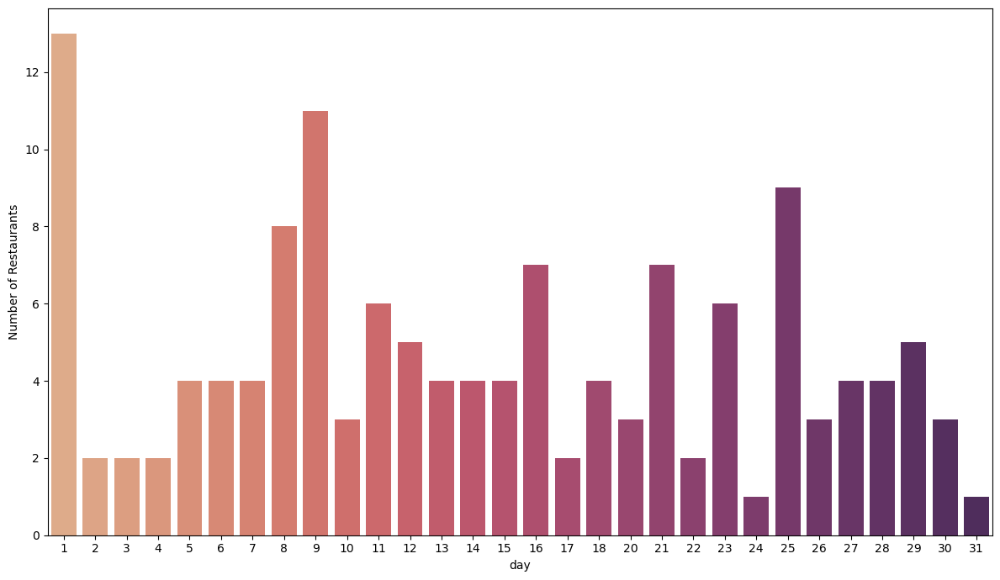

In [40]:
plt.figure(figsize=(12,7))
sns.countplot(x= data["day"],palette="flare")
plt.ylabel("Number of Restaurants")
plt.tight_layout()

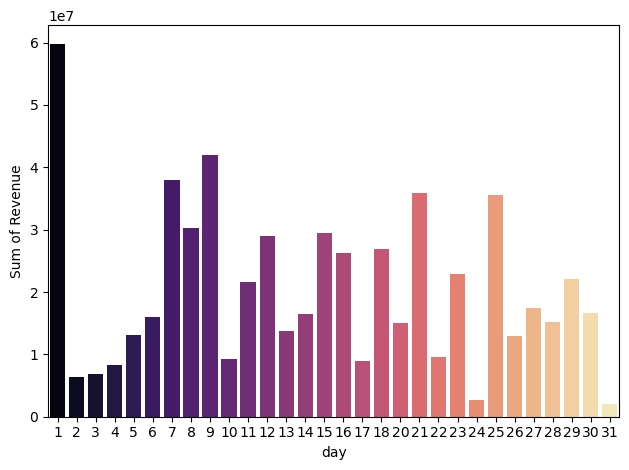

In [52]:
day_df = data.groupby("day")["revenue"].agg(["sum"]).reset_index()
figsize = (2,3)
sns.barplot(x=day_df["day"],y=day_df["sum"],palette = "magma")
plt.ylabel("Sum of Revenue")
plt.tight_layout()

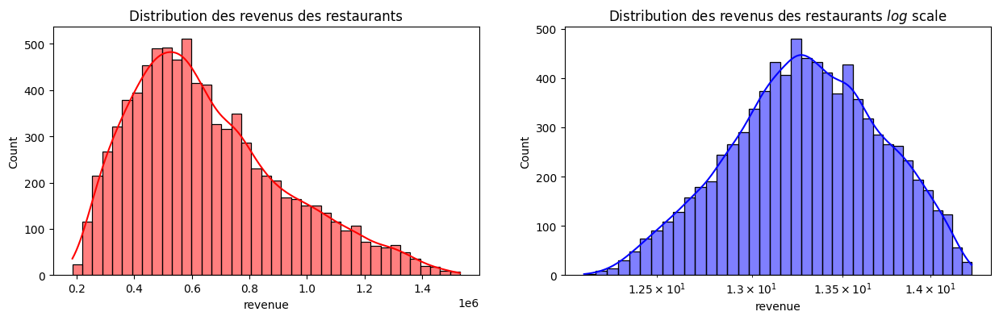

In [77]:
# Target distribution: raw vs log (box-cox transformation)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

sns.histplot(data[TARGET_NAME], color='r', kde=True, ax=axes[0])
axes[0].set_title('Distribution des revenus des restaurants')

sns.histplot(np.log(data[TARGET_NAME]), color='b', kde=True, ax=axes[1])
axes[1].set_title('Distribution des revenus des restaurants $log$ scale')
axes[1].set_xscale('log');

In [81]:
categorical_features = data.select_dtypes(include=["object", "bool"]).columns
logger.info(f"Categorical features:\n {sorted(categorical_features)}\n")

numerical_features = data.select_dtypes(include="number").drop([TARGET_NAME,"id"], axis=1).columns
logger.info(f"Numerical features:\n {sorted(numerical_features)}")

2024-08-05 16:19:13.880 | INFO     | __main__:<module>:2 - Categorical features:
 ['cuisine', 'location', 'parking availability']

2024-08-05 16:19:13.883 | INFO     | __main__:<module>:5 - Numerical features:
 ['ambience score', 'average meal price', 'avg review length', 'chef experience years', 'marketing budget', 'number of reviews', 'rating', 'seating capacity', 'service quality score', 'social media followers', 'weekday reservations', 'weekend reservations']


## Univariate analysis

<Axes: xlabel='location', ylabel='cuisine'>

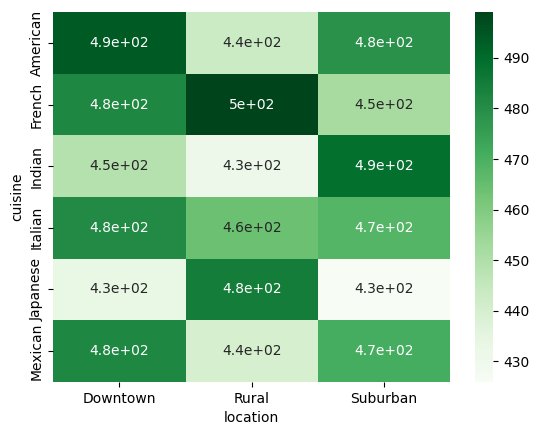

In [82]:
sns.heatmap(pd.crosstab(index=data.city,  # Type de restaurant
                        columns=data["city group"],  # Type de ville
                        margins=False,
                        margins_name="Total", dropna=False),
            cmap="Greens",
            annot=True,
            fmt='.2g',
           )

In [83]:
set(numerical_features)&set(MODEL_PARAMS["DEFAULT_FEATURE_NAMES"])

{'ambience score',
 'average meal price',
 'avg review length',
 'chef experience years',
 'marketing budget',
 'number of reviews',
 'rating',
 'seating capacity',
 'service quality score',
 'social media followers',
 'weekday reservations',
 'weekend reservations'}

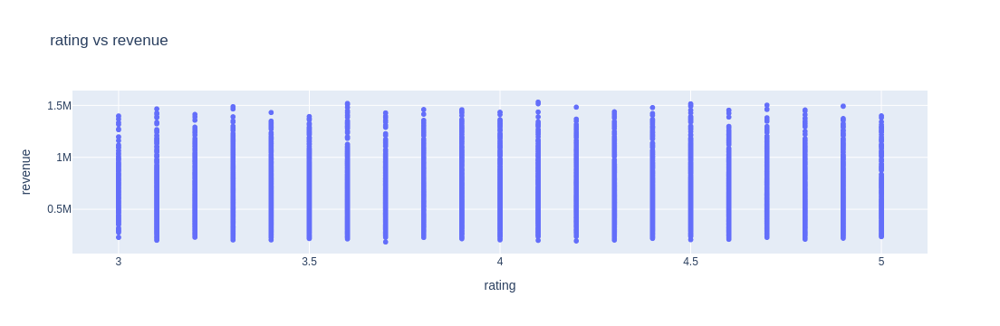

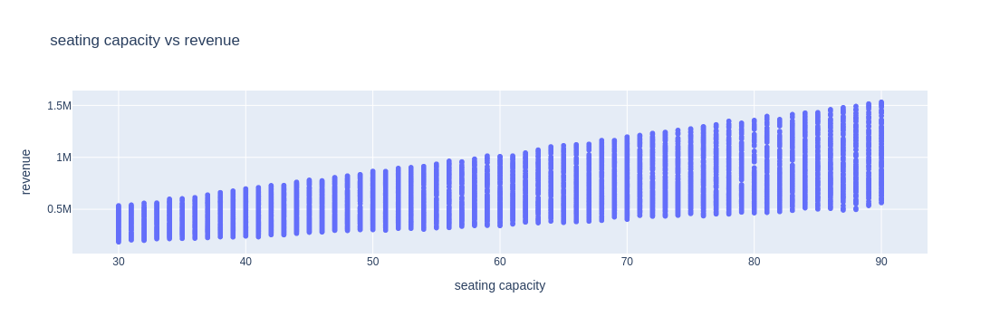

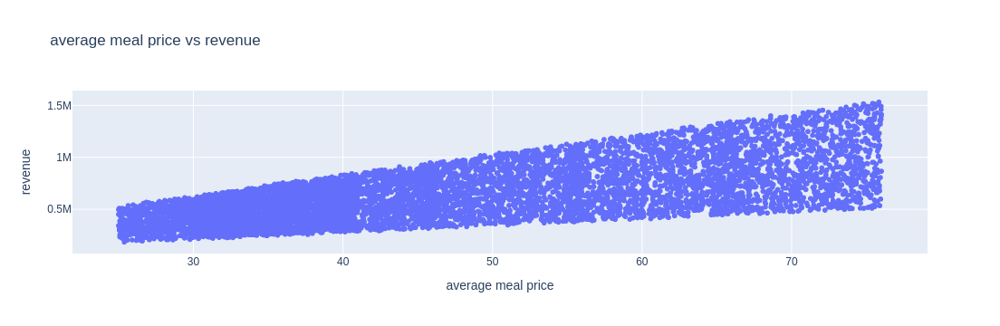

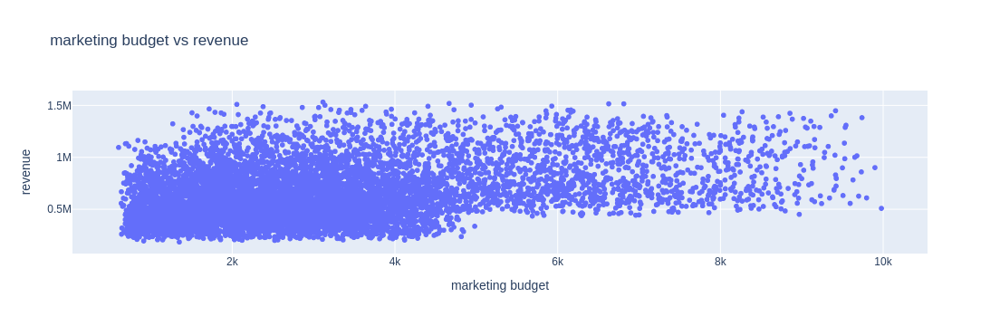

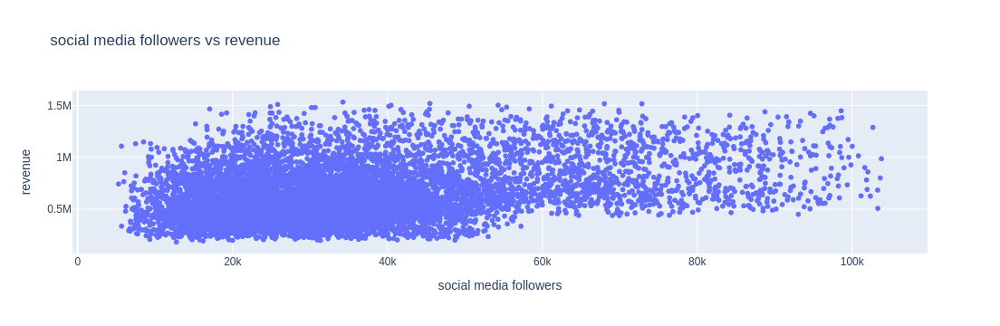

...

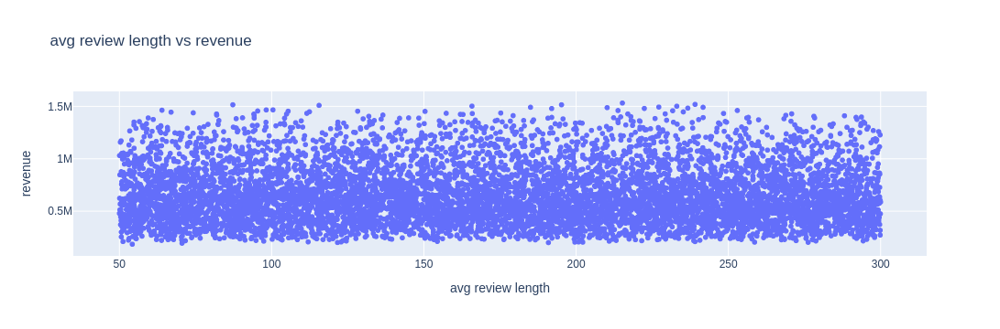

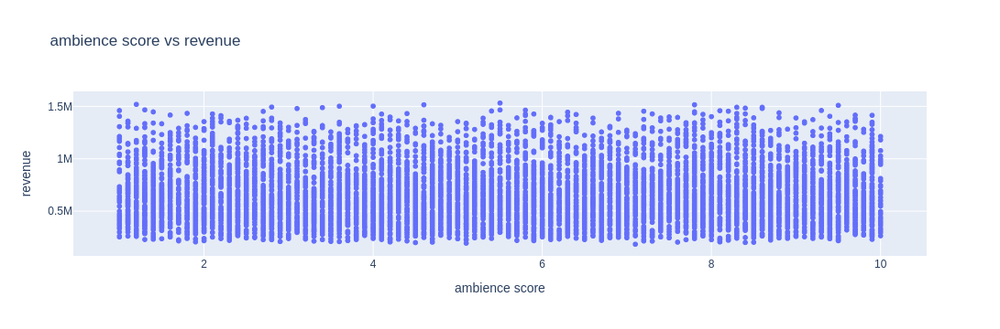

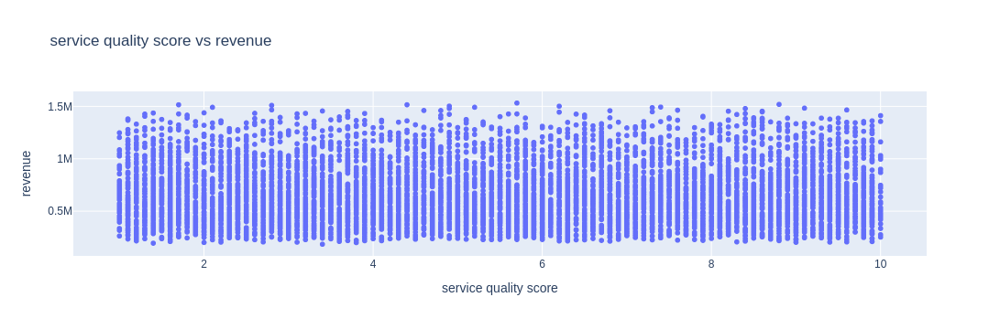

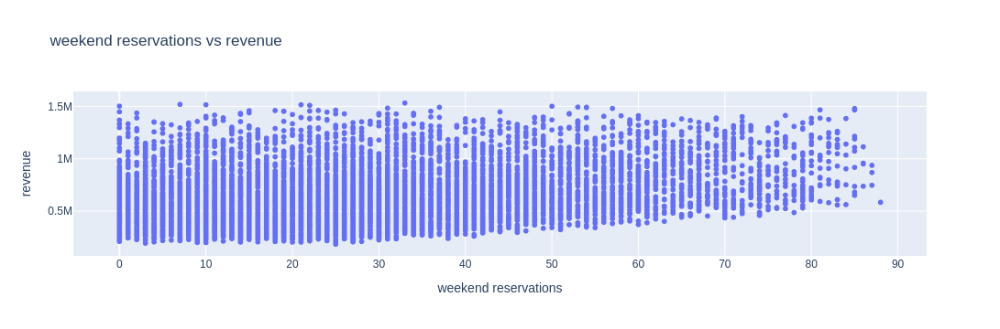

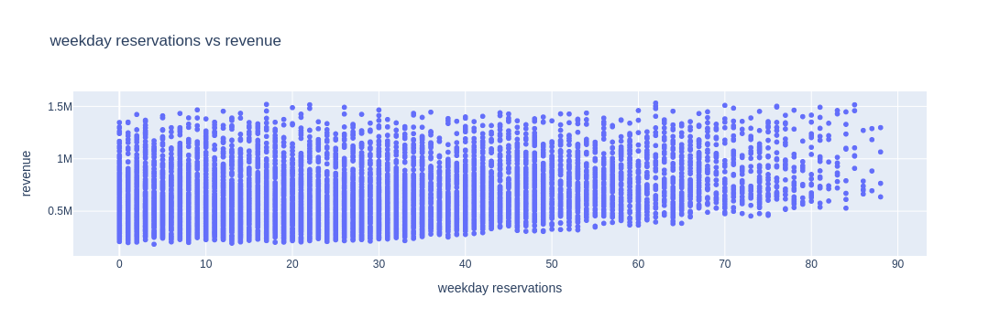

In [84]:
for num_col_name in numerical_features:
    fig = px.scatter(data_frame=data, x=num_col_name, y=TARGET_NAME, title=f"{num_col_name} vs {TARGET_NAME}")
    fig.show()

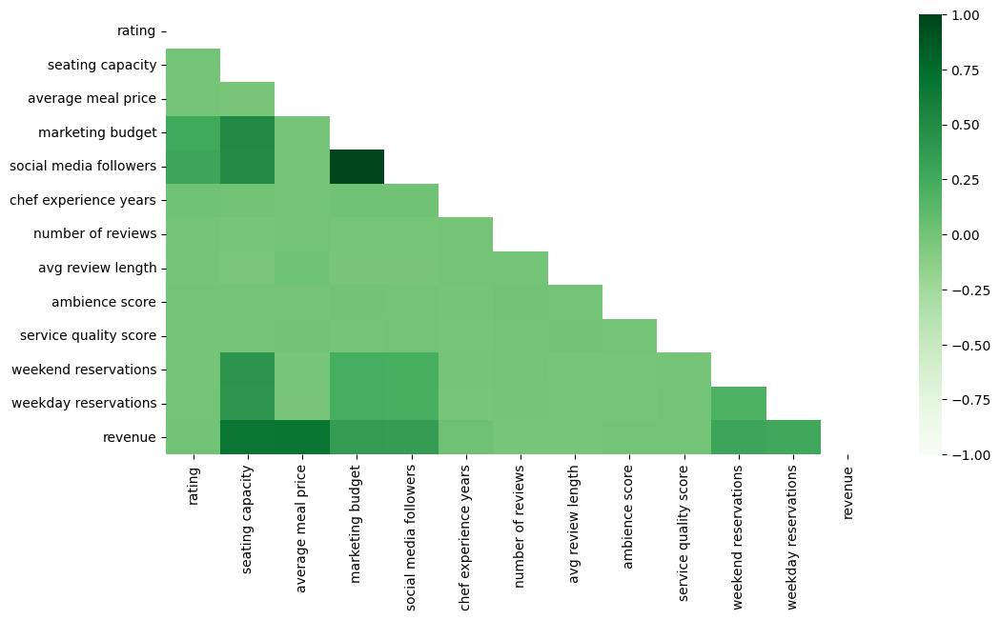

In [85]:
# correlation
num_correlation = data.loc[:, list(numerical_features) + [TARGET_NAME]].corr(method="pearson", numeric_only=True)

# Getting the Upper Triangle of the co-relation matrix
mask = np.triu(num_correlation)

plt.figure(figsize=(12, 6))
sns.heatmap(num_correlation, vmin=-1, vmax=1, annot=False, mask=mask, fmt='.2f', square=False, cmap="Greens");

## Data profiling
## Features selection

In [87]:
# Predictive Power Score (PPS) : https://github.com/8080labs/ppscore/
pps_predictors = pps.predictors(df=data.drop(["name"], axis=1),
                                y=TARGET_NAME, output="df", random_seed=SEED)

In [90]:
pps_predictors

,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
0,cuisine,revenue,0.227150,regression,True,mean absolute error,209855.379838,162186.811170,DecisionTreeRegressor()
1,seating capacity,revenue,0.208966,regression,True,mean absolute error,209855.379838,166002.796021,DecisionTreeRegressor()
2,location,revenue,0.187667,regression,True,mean absolute error,209855.379838,170472.404052,DecisionTreeRegressor()
3,average meal price,revenue,0.031158,regression,True,mean absolute error,209855.379838,203316.737040,DecisionTreeRegressor()
4,weekend reservations,revenue,0.026542,regression,True,mean absolute error,209855.379838,204285.434195,DecisionTreeRegressor()
5,weekday reservations,revenue,0.022633,regression,True,mean absolute error,209855.379838,205105.816203,DecisionTreeRegressor()
6,rating,revenue,0.000000,regression,True,mean absolute error,209855.379838,214394.550130,DecisionTreeRegressor()
7,marketing budget,revenue,0.000000,regression,True,mean absolute error,209855.379838,257958.403238,DecisionTreeRegressor()
8,social media followers,revenue,0.000000,regression,True,mean absolute error,209855.379838,270709.202944,DecisionTreeRegressor()
9,chef experience years,revenue,0.000000,regression,True,mean absolute error,209855.379838,214097.889608,DecisionTreeRegressor()


In [91]:
# check if there are invalide pps scores in the output
pps_predictors.is_valid_score.value_counts()

True    15
Name: is_valid_score, dtype: int64

In [94]:
# get feature names
FEATURE_NAMES = pps_predictors.loc[pps_predictors.ppscore >= MODEL_PARAMS["MIN_PPS"], "x"].values
set(FEATURE_NAMES)

{'ambience score',
 'average meal price',
 'avg review length',
 'chef experience years',
 'cuisine',
 'location',
 'marketing budget',
 'number of reviews',
 'parking availability',
 'rating',
 'seating capacity',
 'service quality score',
 'social media followers',
 'weekday reservations',
 'weekend reservations'}

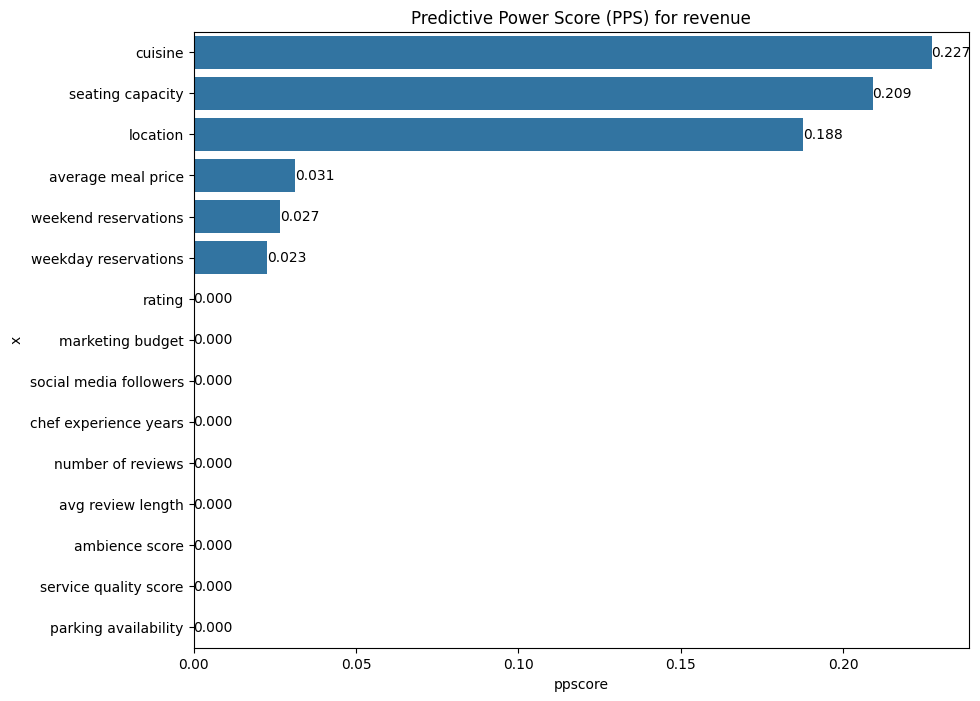

In [95]:
plt.figure(figsize=(10, 8))
ax = sns.barplot(data=pps_predictors.loc[lambda dfr: dfr.ppscore >= 0], y="x", x="ppscore", orient="h")
ax.set_title(F"Predictive Power Score (PPS) for {TARGET_NAME}")

# add the annotation
ax.bar_label(ax.containers[-1], fmt='%.3f', label_type='edge');

In [98]:
data.to_csv(MODEL_PARAMS["DATA_PREPROCESSED_PATH"], index=False)

TypeError: 'method' object is not subscriptable